## ESTAT DELS EMBASSAMENTS A CATALUNYA

#### Es pretèn donar una visió general de l'estat d'aigua dels embassaments a Catalunya.

#### Primer de tot volem mostrar la ubicació dels pantans a Catalunya i les seves dades bàsiques amb folium, una llibreria que permet la presentació geogràfica de dades.

In [1]:
import pandas as pd
import folium

# Carreguem l'arxiu data
arxiu = 'data.csv'

# Transformem l'arxiu en dataframe
df = pd.read_csv(arxiu)

# Incorporem les coordenades
coordenades = {
    'Embassament de Foix (Castellet i la Gornal)': {'latitud': 41.2586889, 'longitud': 1.6412138},
    'Embassament de la Baells (Cercs)': {'latitud': 42.1488357, 'longitud': 1.8544642},
    'Embassament de Sau (Vilanova de Sau)': {'latitud': 41.9764571, 'longitud': 2.3690188},
    'Embassament de Darnius Boadella (Darnius)': {'latitud': 42.3461727, 'longitud': 2.7714114},
    'Embassament de Susqueda (Osor)': {'latitud': 41.9820757, 'longitud': 2.468363},
    'Embassament de Sant Ponç (Clariana de Cardener)': {'latitud': 41.9828464, 'longitud': 1.5494828},
    'Embassament de la Llosa del Cavall (Navès)': {'latitud': 42.118992, 'longitud': 1.5677914},
    'Embassament de Siurana (Cornudella de Montsant)': {'latitud': 41.254525, 'longitud': 0.9128953},
    'Embassament de Riudecanyes': {'latitud': 41.1376013, 'longitud': 0.9404629}
}

# Apliquem les coordenades al dataframe amb noves columnes latitud i longitud
for estacio, coordenada in coordenades.items():
    condicio = df['estaci'] == estacio
    df.loc[condicio, 'latitud'] = coordenada['latitud']
    df.loc[condicio, 'longitud'] = coordenada['longitud']

# Eliminem la columna id perque no interessa
df = df.drop('id', axis=1)

# Generem un dataframe més petit per localitzar nomès les darreres dades disponibles del dataset
df2 = df.head(9)

# Generem un nou dataframe que posteriorment utilitzarem
plotly = df2.copy()

# Muntem el mapa 
mapa = folium.Map(location=[df2['latitud'].mean(), df2['longitud'].mean()], zoom_start=5)

# Generem els punts
for i, row in df2.iterrows():
    folium.Marker([row['latitud'], row['longitud']],
                  popup=f"<strong>Estació:</strong> {row['estaci']}<br><strong>Nivell hm3:</strong> {row['volum_embassat']}<br><strong>Percentatge:</strong> {row['percentatge_volum_embassat']}<br><strong>Dia:</strong> 27/12/2023").add_to(mapa)

# Guardem el mapa a la carpeta per poder obrir-lo en html
mapa.save('mapa_interactiu.html')

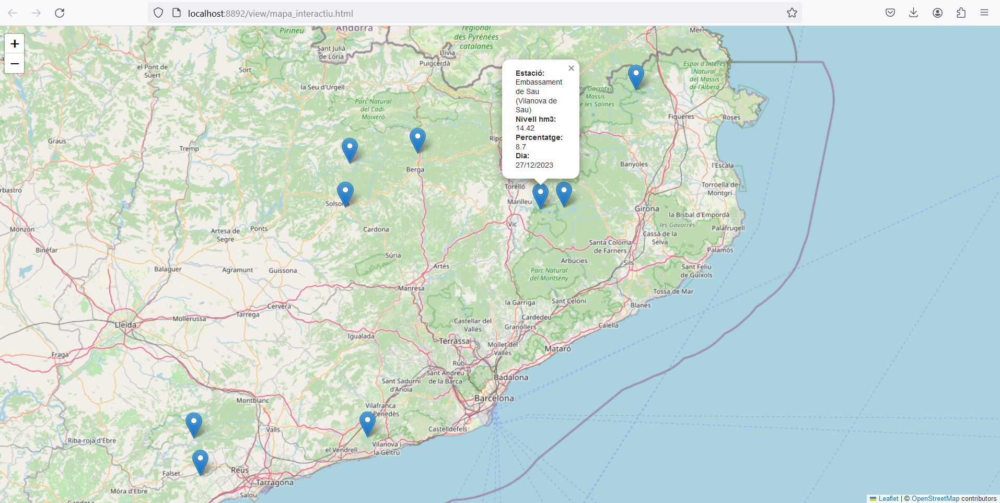

Ja ens podem fer una idea de quina ubicació tenen els pantans i les seves dades bàsiques

Per altra banda, també podem mostrar en histograma la capacitat actual dels pantans ordenats de menor a major percentatge

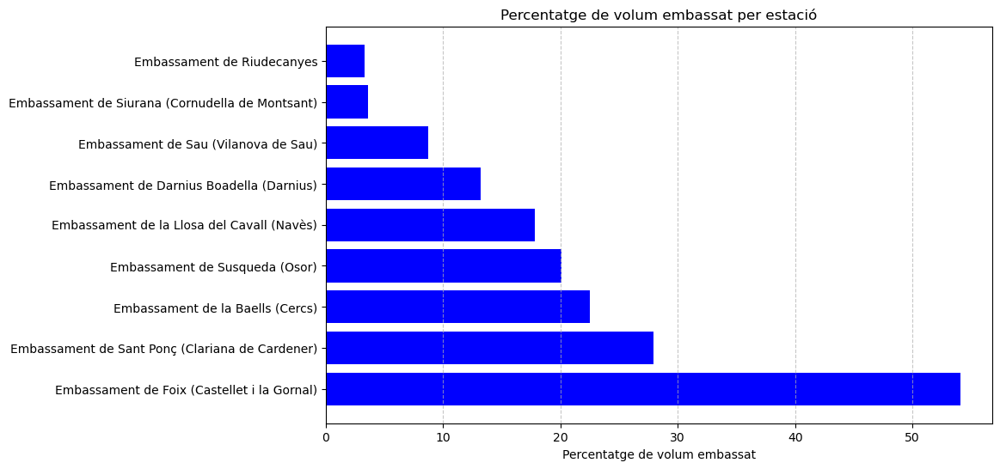

In [2]:
import pandas as pd
import matplotlib.pyplot as plt

# Ordenem els valors per percentatge de volum embassat
df2 = df2.sort_values(by='percentatge_volum_embassat', ascending=False)

# Generem el gràfic
plt.figure(figsize=(10, 6))
plt.barh(df2['estaci'], df2['percentatge_volum_embassat'], color='blue')
plt.xlabel('Percentatge de volum embassat')
plt.title('Percentatge de volum embassat per estació')
plt.grid(axis='x', linestyle='--', alpha=0.7)
plt.show()

In [3]:
import plotly.express as px

# Donem format de data a la columna dia
df['dia'] = pd.to_datetime(df['dia'])

# Ordenem el DataFrame por la columna 'dia'
df.sort_values(by='dia', inplace=True)

# Filtrem el DataFrame per a cada estació
df1 = df[df['estaci'] == 'Embassament de Foix (Castellet i la Gornal)']
df2 = df[df['estaci'] == 'Embassament de la Baells (Cercs)']
df3 = df[df['estaci'] == 'Embassament de Sau (Vilanova de Sau)']
df4 = df[df['estaci'] == 'Embassament de Darnius Boadella (Darnius)']
df5 = df[df['estaci'] == 'Embassament de Susqueda (Osor)']
df6 = df[df['estaci'] == 'Embassament de Sant Ponç (Clariana de Cardener)']
df7 = df[df['estaci'] == 'Embassament de la Llosa del Cavall (Navès)']
df8 = df[df['estaci'] == 'Embassament de Siurana (Cornudella de Montsant)']
df9 = df[df['estaci'] == 'Embassament de Riudecanyes']

# Creem el gràfic
fig = px.line(title="Evolució del volum d'aigua dels pantans a Catalunya")

# Afegim les linies al gràfic
for estacion, datos in zip(['Embassament de Foix', 'Embassament de la Baells', 'Embassament de Sau',
                            'Embassament de Darnius Boadella (Darnius)', 'Embassament de Susqueda (Osor)',
                            'Embassament de Sant Ponç (Clariana de Cardener)', 'Embassament de la Llosa del Cavall (Navès)',
                            'Embassament de Siurana (Cornudella de Montsant)', 'Embassament de Riudecanyes'],
                           [df1, df2, df3, df4, df5, df6, df7, df8, df9]):
    fig.add_scatter(x=datos['dia'], y=datos['percentatge_volum_embassat'], mode='lines', name=estacion)

# Personalitzem algun element
fig.update_layout(xaxis_title="Data", yaxis_title="Percentatge sobre el volum total")
fig.show()

Veiem que l'evolució històrica del percentatge de volum emmagatzemat en els embassaments és força volatil. 

A més, el gràfic anterior mostra que l'embassament de Riudecanyes s'ha situat molt sovint en valors baixos així com l'embassament de siurana. Pel que fa a l'embassament de foix sembla que s'ha mantingut en valors més alts.

Podem muntar un nou mapa per presentar amb escala de colors l'estat dels embassaments:

In [8]:
import pandas as pd
import plotly.express as px

# Creem el mapa interactiu amb plotly express
fig = px.scatter_geo(
    plotly,
    lat='latitud',
    lon='longitud',
    text='estaci',
    hover_name='estaci',
    size='percentatge_volum_embassat',  
    color='percentatge_volum_embassat', 
    projection='natural earth'
)

# Personalizar el diseño del mapa
fig.update_layout(
    title='Mapa interactiu sobre el percentatge de volum dels embassaments a Catalunya',
    geo=dict(showcoastlines=True, coastlinecolor="Black", showland=True),
    font=dict(size=8)
)

# Mostrar el mapa interactivo
fig.show()

Però realment el percentatge de volum importa tant ? Fem el mateix mapa anterior però amb volum 

In [9]:
import pandas as pd
import plotly.express as px

# Creem el mapa interactiu amb plotly express
fig = px.scatter_geo(
    plotly,
    lat='latitud',
    lon='longitud',
    text='estaci',
    hover_name='estaci',
    size='volum_embassat',  
    color='volum_embassat', 
    projection='natural earth'
)

# Personalizar el diseño del mapa
fig.update_layout(
    title='Mapa interactiu sobre el percentatge de volum dels embassaments a Catalunya',
    geo=dict(showcoastlines=True, coastlinecolor="Black", showland=True),
    font=dict(size=8)
)

# Mostrar el mapa interactivo
fig.show()

Si comparem ambdòs gràfics veiem que l'embassament de Foix es situa en un percentatge d'aigua superior al 50% però en realitat es tracta dels embassaments més petits de Catalunya... 

De la mateixa manera, Cercs mostra un baix percentatge de volum però alt volum absolut en hm3

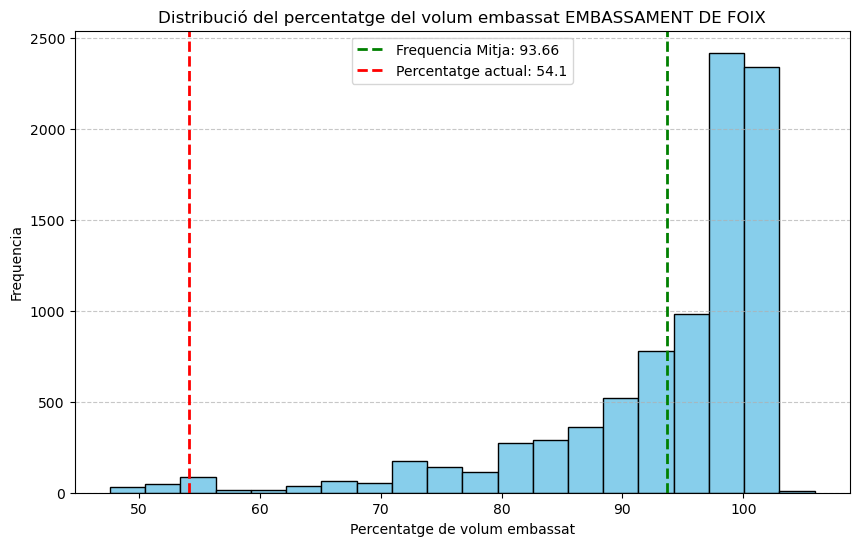

In [67]:
import pandas as pd
import matplotlib.pyplot as plt

# Especifiquem la data que volem mostrar
data_especifica = '27/12/2023'
percentatge_especific = df1.loc[df['dia'] == data_especifica, 'percentatge_volum_embassat'].values[0]

# Muntem la frequencia mitja
frequencia_mitja = df1['percentatge_volum_embassat'].mean()

# Creem l'histograma
plt.figure(figsize=(10, 6))
plt.hist(df1['percentatge_volum_embassat'], bins=20, color='skyblue', edgecolor='black')

# Afegim una línia vertical per mostrar la frequencia mitja
plt.axvline(x=frequencia_mitja, color='green', linestyle='--', linewidth=2, label=f'Frequencia Mitja: {frequencia_mitja:.2f}')

# Afegim una línia vertical per mostrar el percentatge del percentatge de volum actual
plt.axvline(x=percentatge_especific, color='red', linestyle='--', linewidth=2, label=f'Percentatge actual: {percentatge_especific}')

# Personalitzem
plt.title('Distribució del percentatge del volum embassat EMBASSAMENT DE FOIX')
plt.xlabel('Percentatge de volum embassat')
plt.ylabel('Frequencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Mostrar el histograma
plt.show()

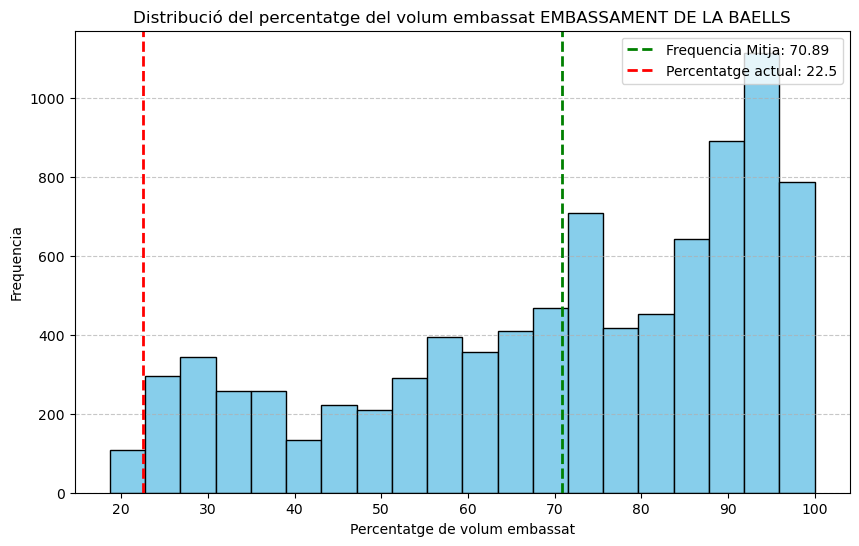

In [68]:
import pandas as pd
import matplotlib.pyplot as plt

# Especifiquem la data que volem mostrar
data_especifica = '27/12/2023'
percentatge_especific = df2.loc[df['dia'] == data_especifica, 'percentatge_volum_embassat'].values[0]

# Muntem la frequencia mitja
frequencia_mitja = df2['percentatge_volum_embassat'].mean()

# Creem l'histograma
plt.figure(figsize=(10, 6))
plt.hist(df2['percentatge_volum_embassat'], bins=20, color='skyblue', edgecolor='black')

# Afegim una línia vertical per mostrar la frequencia mitja
plt.axvline(x=frequencia_mitja, color='green', linestyle='--', linewidth=2, label=f'Frequencia Mitja: {frequencia_mitja:.2f}')

# Afegim una línia vertical per mostrar el percentatge del percentatge de volum actual
plt.axvline(x=percentatge_especific, color='red', linestyle='--', linewidth=2, label=f'Percentatge actual: {percentatge_especific}')

# Personalitzem
plt.title('Distribució del percentatge del volum embassat EMBASSAMENT DE LA BAELLS')
plt.xlabel('Percentatge de volum embassat')
plt.ylabel('Frequencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Mostrar el histograma
plt.show()

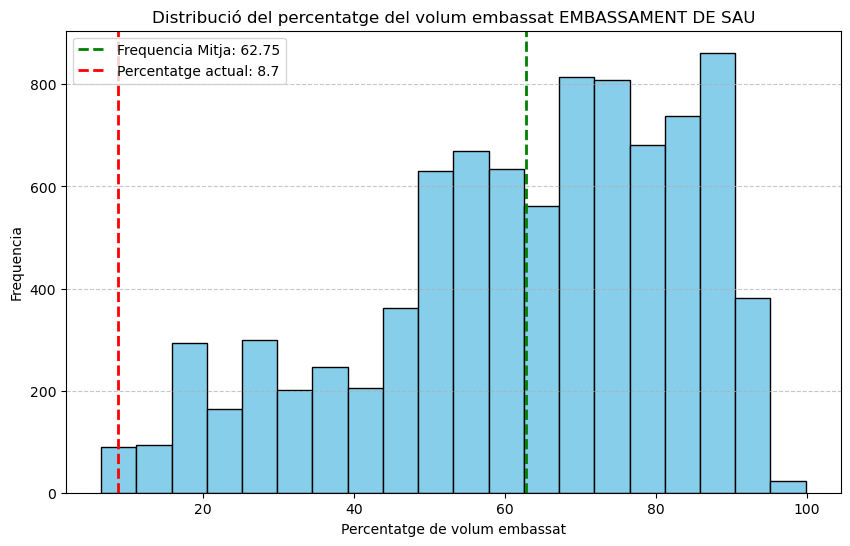

In [69]:
import pandas as pd
import matplotlib.pyplot as plt

# Especifiquem la data que volem mostrar
data_especifica = '27/12/2023'
percentatge_especific = df3.loc[df['dia'] == data_especifica, 'percentatge_volum_embassat'].values[0]

# Muntem la frequencia mitja
frequencia_mitja = df3['percentatge_volum_embassat'].mean()

# Creem l'histograma
plt.figure(figsize=(10, 6))
plt.hist(df3['percentatge_volum_embassat'], bins=20, color='skyblue', edgecolor='black')

# Afegim una línia vertical per mostrar la frequencia mitja
plt.axvline(x=frequencia_mitja, color='green', linestyle='--', linewidth=2, label=f'Frequencia Mitja: {frequencia_mitja:.2f}')

# Afegim una línia vertical per mostrar el percentatge del percentatge de volum actual
plt.axvline(x=percentatge_especific, color='red', linestyle='--', linewidth=2, label=f'Percentatge actual: {percentatge_especific}')

# Personalitzem
plt.title('Distribució del percentatge del volum embassat EMBASSAMENT DE SAU')
plt.xlabel('Percentatge de volum embassat')
plt.ylabel('Frequencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Mostrar el histograma
plt.show()

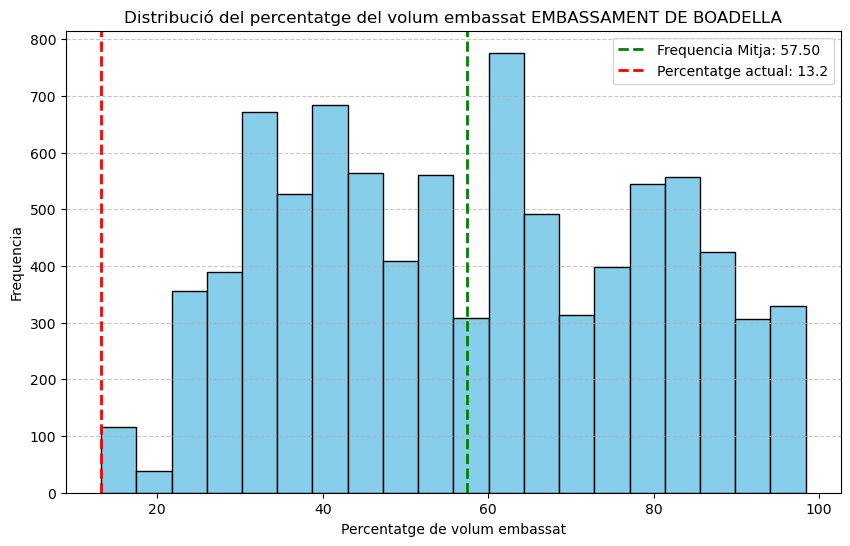

In [70]:
import pandas as pd
import matplotlib.pyplot as plt

# Especifiquem la data que volem mostrar
data_especifica = '27/12/2023'
percentatge_especific = df4.loc[df['dia'] == data_especifica, 'percentatge_volum_embassat'].values[0]

# Muntem la frequencia mitja
frequencia_mitja = df4['percentatge_volum_embassat'].mean()

# Creem l'histograma
plt.figure(figsize=(10, 6))
plt.hist(df4['percentatge_volum_embassat'], bins=20, color='skyblue', edgecolor='black')

# Afegim una línia vertical per mostrar la frequencia mitja
plt.axvline(x=frequencia_mitja, color='green', linestyle='--', linewidth=2, label=f'Frequencia Mitja: {frequencia_mitja:.2f}')

# Afegim una línia vertical per mostrar el percentatge del percentatge de volum actual
plt.axvline(x=percentatge_especific, color='red', linestyle='--', linewidth=2, label=f'Percentatge actual: {percentatge_especific}')

# Personalitzem
plt.title('Distribució del percentatge del volum embassat EMBASSAMENT DE BOADELLA')
plt.xlabel('Percentatge de volum embassat')
plt.ylabel('Frequencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Mostrar el histograma
plt.show()

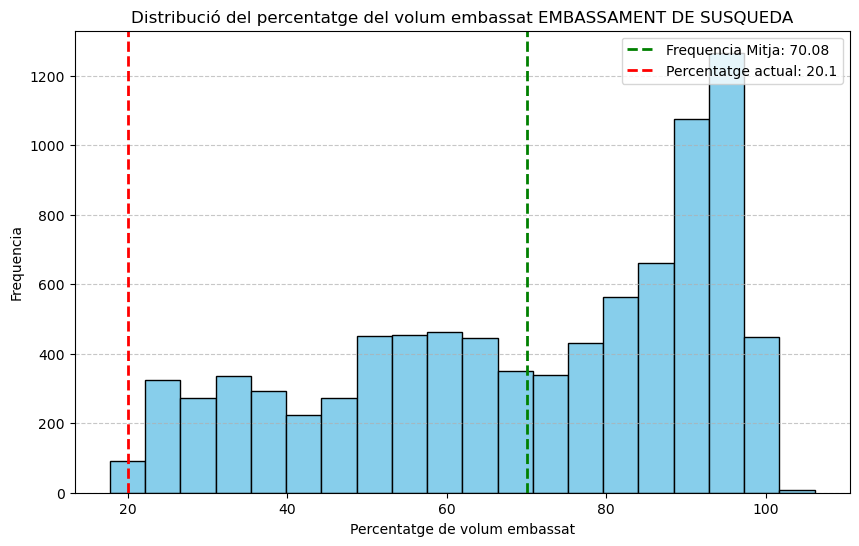

In [71]:
import pandas as pd
import matplotlib.pyplot as plt

# Especifiquem la data que volem mostrar
data_especifica = '27/12/2023'
percentatge_especific = df5.loc[df['dia'] == data_especifica, 'percentatge_volum_embassat'].values[0]

# Muntem la frequencia mitja
frequencia_mitja = df5['percentatge_volum_embassat'].mean()

# Creem l'histograma
plt.figure(figsize=(10, 6))
plt.hist(df5['percentatge_volum_embassat'], bins=20, color='skyblue', edgecolor='black')

# Afegim una línia vertical per mostrar la frequencia mitja
plt.axvline(x=frequencia_mitja, color='green', linestyle='--', linewidth=2, label=f'Frequencia Mitja: {frequencia_mitja:.2f}')

# Afegim una línia vertical per mostrar el percentatge del percentatge de volum actual
plt.axvline(x=percentatge_especific, color='red', linestyle='--', linewidth=2, label=f'Percentatge actual: {percentatge_especific}')

# Personalitzem
plt.title('Distribució del percentatge del volum embassat EMBASSAMENT DE SUSQUEDA')
plt.xlabel('Percentatge de volum embassat')
plt.ylabel('Frequencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Mostrar el histograma
plt.show()

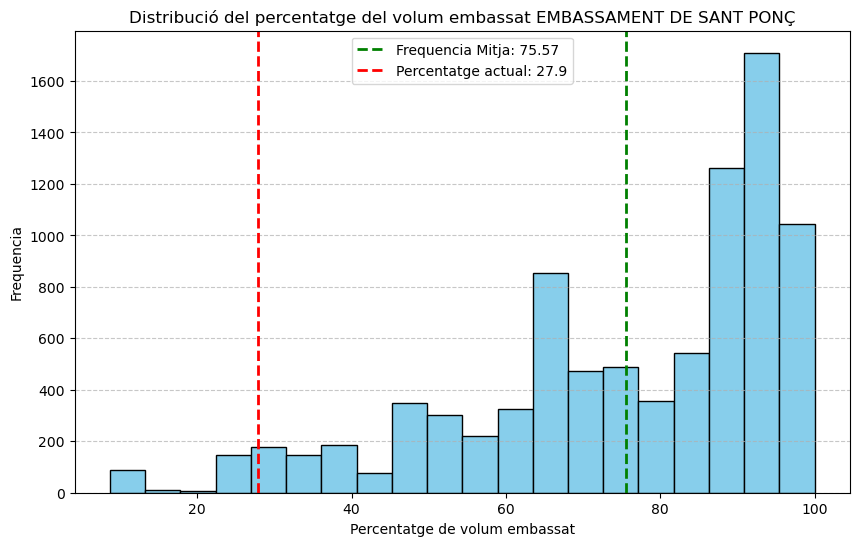

In [72]:
import pandas as pd
import matplotlib.pyplot as plt

# Especifiquem la data que volem mostrar
data_especifica = '27/12/2023'
percentatge_especific = df6.loc[df['dia'] == data_especifica, 'percentatge_volum_embassat'].values[0]

# Muntem la frequencia mitja
frequencia_mitja = df6['percentatge_volum_embassat'].mean()

# Creem l'histograma
plt.figure(figsize=(10, 6))
plt.hist(df6['percentatge_volum_embassat'], bins=20, color='skyblue', edgecolor='black')

# Afegim una línia vertical per mostrar la frequencia mitja
plt.axvline(x=frequencia_mitja, color='green', linestyle='--', linewidth=2, label=f'Frequencia Mitja: {frequencia_mitja:.2f}')

# Afegim una línia vertical per mostrar el percentatge del percentatge de volum actual
plt.axvline(x=percentatge_especific, color='red', linestyle='--', linewidth=2, label=f'Percentatge actual: {percentatge_especific}')

# Personalitzem
plt.title('Distribució del percentatge del volum embassat EMBASSAMENT DE SANT PONÇ')
plt.xlabel('Percentatge de volum embassat')
plt.ylabel('Frequencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Mostrar el histograma
plt.show()

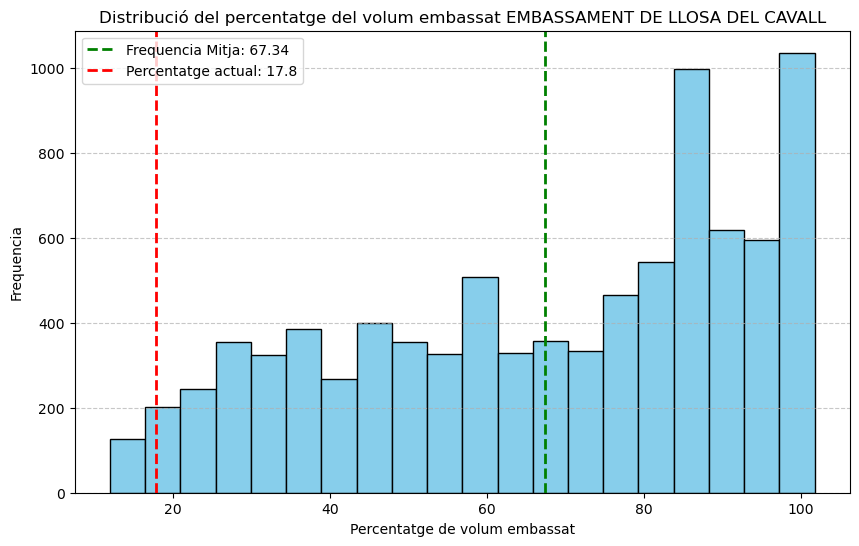

In [73]:
import pandas as pd
import matplotlib.pyplot as plt

# Especifiquem la data que volem mostrar
data_especifica = '27/12/2023'
percentatge_especific = df7.loc[df['dia'] == data_especifica, 'percentatge_volum_embassat'].values[0]

# Muntem la frequencia mitja
frequencia_mitja = df7['percentatge_volum_embassat'].mean()

# Creem l'histograma
plt.figure(figsize=(10, 6))
plt.hist(df7['percentatge_volum_embassat'], bins=20, color='skyblue', edgecolor='black')

# Afegim una línia vertical per mostrar la frequencia mitja
plt.axvline(x=frequencia_mitja, color='green', linestyle='--', linewidth=2, label=f'Frequencia Mitja: {frequencia_mitja:.2f}')

# Afegim una línia vertical per mostrar el percentatge del percentatge de volum actual
plt.axvline(x=percentatge_especific, color='red', linestyle='--', linewidth=2, label=f'Percentatge actual: {percentatge_especific}')

# Personalitzem
plt.title('Distribució del percentatge del volum embassat EMBASSAMENT DE LLOSA DEL CAVALL')
plt.xlabel('Percentatge de volum embassat')
plt.ylabel('Frequencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Mostrar el histograma
plt.show()

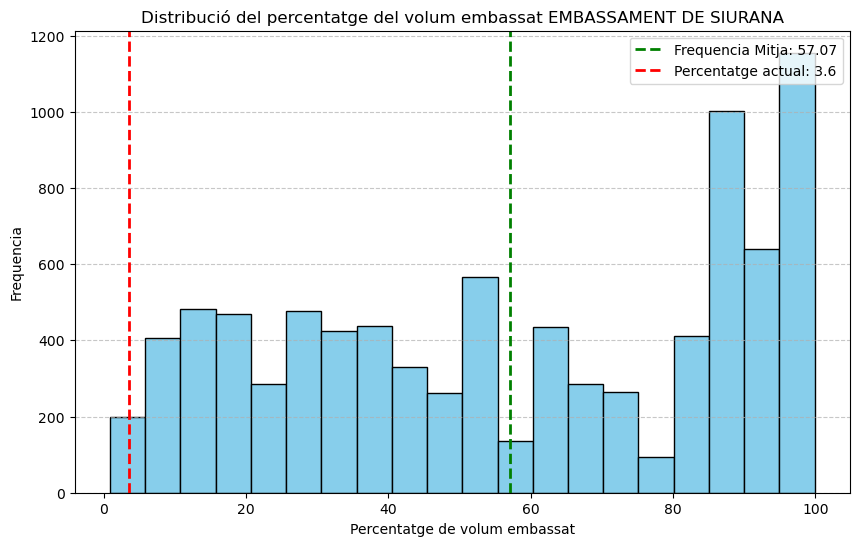

In [74]:
import pandas as pd
import matplotlib.pyplot as plt

# Especifiquem la data que volem mostrar
data_especifica = '27/12/2023'
percentatge_especific = df8.loc[df['dia'] == data_especifica, 'percentatge_volum_embassat'].values[0]

# Muntem la frequencia mitja
frequencia_mitja = df8['percentatge_volum_embassat'].mean()

# Creem l'histograma
plt.figure(figsize=(10, 6))
plt.hist(df8['percentatge_volum_embassat'], bins=20, color='skyblue', edgecolor='black')

# Afegim una línia vertical per mostrar la frequencia mitja
plt.axvline(x=frequencia_mitja, color='green', linestyle='--', linewidth=2, label=f'Frequencia Mitja: {frequencia_mitja:.2f}')

# Afegim una línia vertical per mostrar el percentatge del percentatge de volum actual
plt.axvline(x=percentatge_especific, color='red', linestyle='--', linewidth=2, label=f'Percentatge actual: {percentatge_especific}')

# Personalitzem
plt.title('Distribució del percentatge del volum embassat EMBASSAMENT DE SIURANA')
plt.xlabel('Percentatge de volum embassat')
plt.ylabel('Frequencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Mostrar el histograma
plt.show()

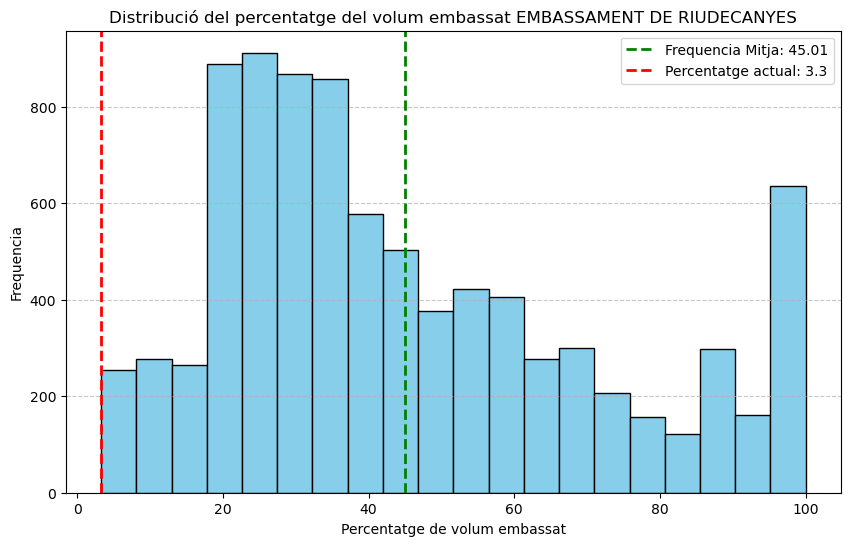

In [75]:
import pandas as pd
import matplotlib.pyplot as plt

# Especifiquem la data que volem mostrar
data_especifica = '27/12/2023'
percentatge_especific = df9.loc[df['dia'] == data_especifica, 'percentatge_volum_embassat'].values[0]

# Muntem la frequencia mitja
frequencia_mitja = df9['percentatge_volum_embassat'].mean()

# Creem l'histograma
plt.figure(figsize=(10, 6))
plt.hist(df9['percentatge_volum_embassat'], bins=20, color='skyblue', edgecolor='black')

# Afegim una línia vertical per mostrar la frequencia mitja
plt.axvline(x=frequencia_mitja, color='green', linestyle='--', linewidth=2, label=f'Frequencia Mitja: {frequencia_mitja:.2f}')

# Afegim una línia vertical per mostrar el percentatge del percentatge de volum actual
plt.axvline(x=percentatge_especific, color='red', linestyle='--', linewidth=2, label=f'Percentatge actual: {percentatge_especific}')

# Personalitzem
plt.title('Distribució del percentatge del volum embassat EMBASSAMENT DE RIUDECANYES')
plt.xlabel('Percentatge de volum embassat')
plt.ylabel('Frequencia')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.legend()

# Mostrar el histograma
plt.show()

En conclusió, el dataset mostrat que contenia 73000 entrades ens ha donat una perspectiva històrica de l'estat dels embassaments d'on s'en poden extreure algunes observacions:

Bones noticies:
- Els embassaments a Catalunya han mostrar força volatilitat en el temps.
- Apareixen èpoques en que el buidat i reemplenat dels embassaments ha estat relativament ràpid.

Males notícies:
- Els embassaments mostren un percentatge de volum embassat per sota de la mitja i alguns sense precedents anteriors. 